*Sen2+1Cube*: Luke McQuade, June 2023 

# Prototyping *dpolcat*

Automated categorization of dual-polarimetric radar imagery - for Sentinel-1.


## Setup

Adapted from [1].

In [11]:
import ipyleaflet
import matplotlib.pyplot as plt
import numpy as np
import pystac
import pystac_client
import planetary_computer
import requests
import rioxarray
import rich.table
import seaborn
import stackstac
import xarray

from IPython.display import Image

### Helpers

In [2]:
from pyproj import Transformer

def bbox_to_lonlat(bbox, epsg):
    t = Transformer.from_crs(f"EPSG:{epsg}", "EPSG:4326")
    minY, minX = t.transform(bbox[0], bbox[1])
    maxY, maxX = t.transform(bbox[2], bbox[3])
    return [minX, minY, maxX, maxY]


def bbox_contains_bbox(bbox1, bbox2):
    # Tests whether bbox1 completely contains bbox2.
    # Note. not valid for date-line crossing.
    minx1, miny1, maxx1, maxy1 = bbox1
    minx2, miny2, maxx2, maxy2 = bbox2
    return minx1 <= minx2 <= maxx1 and miny1 <= miny2 <= maxy1

    
# Summarize catalog search results
def summarize(item_collection, search_bbox_lonlat):
    table = rich.table.Table("id", "date", "A/D", "epsg", "bbox_lonlat", "bbox_enc", width=230)
    for item in item_collection:
        a_or_d = item.properties["sat:orbit_state"]
        item_epsg = item.properties["proj:epsg"]
        item_bbox = item.properties["proj:bbox"]
        item_bbox_lonlat = bbox_to_lonlat(epsg = item_epsg, bbox = item_bbox)
        bbox_enc = bbox_contains_bbox(item_bbox_lonlat, search_bbox_lonlat)
        table.add_row(item.id, item.properties["start_datetime"], a_or_d, str(item_epsg), str(item_bbox_lonlat), str(bbox_enc))
    return table


def get_item_by_id(item_collection, id: str):
    return [item for item in item_collection if item.id == id][0]

### Select source image

In [3]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [4]:
# aoi = "tenerife"
aoi = "salzburg"

if aoi == "salzburg":
    epsg_num = 32633 # UTM zone 33N
    bbox = [13.02, 47.76, 13.09, 47.83]
    item_i = 1
    resolution = 10

elif aoi == "tenerife": 
    epsg_num = 32628 # UTM zone 28N
    bbox = [-16.96, 27.92, -16.05, 28.61]
    item_i = 2
    resolution = 10

In [5]:
search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime="2022-06-01/2022-06-15"
)
items = search.item_collection()
print(f"Found {len(items)} items")
item = items[item_i]


Found 2 items


### Preview source image

In [6]:
Image(url=item.assets["rendered_preview"].href)

### Source image metadata

In [7]:
table = rich.table.Table("key", "value")
for k, v in sorted(item.properties.items()):
    table.add_row(k, str(v))

table

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ key                                   ┃ value                                                       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ constellation                         │ Sentinel-1                                                  │
│ datetime                              │ 2022-06-04T16:59:35.976802Z                                 │
│ end_datetime                          │ 2022-06-04 16:59:48.476194+00:00                            │
│ platform                              │ SENTINEL-1A                                                 │
│ proj:bbox                             │ [213660.0, 5180150.0, 501930.0, 5386080.0]                  │
│ proj:epsg                             │ 32633                                                       │
│ proj:shape                            │ [20593, 28827]                                              │
│ proj:transform                        │ [10.0, 0.0, 213660.0, 0.0, -10.0, 5386080.0, 0.0, 0.0, 1.0] │
│ s1:datatake_id                        │ 340507                                                      │
│ s1:instrument_configuration_ID        │ 7                                                           │
│ s1:orbit_source                       │ PREORB                                                      │
│ s1:processing_level                   │ 1                                                           │
│ s1:product_timeliness                 │ NRT-3h                                                      │
│ s1:resolution                         │ high                                                        │
│ s1:shape                              │ [28827, 20593]                                              │
│ s1:slice_number                       │ 12                                                          │
│ s1:total_slices                       │ 28                                                          │
│ sar:center_frequency                  │ 5.405                                                       │
│ sar:frequency_band                    │ C                                                           │
│ sar:instrument_mode                   │ IW                                                          │
│ sar:looks_azimuth                     │ 1                                                           │
│ sar:looks_equivalent_number           │ 4.4                                                         │
│ sar:looks_range                       │ 5                                                           │
│ sar:observation_direction             │ right                                                       │
│ sar:pixel_spacing_azimuth             │ 10                                                          │
│ sar:pixel_spacing_range               │ 10                                                          │
│ sar:polarizations                     │ ['VV', 'VH']                                                │
│ sar:product_type                      │ GRD                                                         │
│ sar:resolution_azimuth                │ 22                                                          │
│ sar:resolution_range                  │ 20                                                          │
│ sat:absolute_orbit                    │ 43516                                                       │
│ sat:orbit_state                       │ ascending                                                   │
│ sat:platform_international_designator │ 2014-016A                                                   │
│ sat:relative_orbit                    │ 44                                                          │
│ start_datetime                        │ 2022-06-04 16:59:23.477410+00:00                            │
└───────────────────────────────────────┴───────

### Load VV and VH band data

In [8]:
ds = stackstac.stack(item, bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv")[0].compute()
vh = ds.sel(band="vh")[0].compute()

/srv/conda/envs/notebook/lib/python3.11/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


### Re-scale (linear to dB)

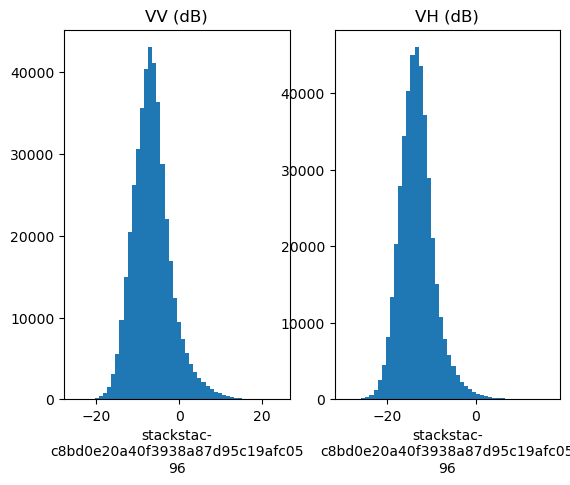

In [9]:
# Note: you can skip this cell to reduce memory usage.
def db_scale(x):
    return 10 * np.log10(x)

vv_db = db_scale(vv)
vh_db = db_scale(vh)
 
fig, axs = plt.subplots(1, 2)

vv_db.plot.hist(bins=50, ax=axs[0])
axs[0].set_title("VV (dB)")
 
vh_db.plot.hist(bins=50, ax=axs[1])
axs[1].set_title("VH (dB)")
 
plt.show()

### Custom scaling

A shift-log-root scaling results in most values falling in the range 0 to 1, which is a little easier to work with. 

Note: taking the 4th root (rather than the 2nd root) results in more evenly distributed values, but adds significant bias in the low-end and is not that useful in practice.

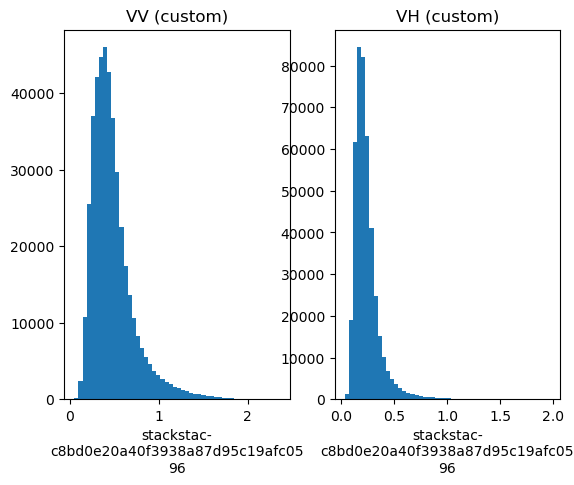

In [10]:
def scale_nice(x):
    return np.sqrt(np.log(x + 1))

vv2 = scale_nice(vv)
vh2 = scale_nice(vh)

fig, axs = plt.subplots(1, 2)

vv2.plot.hist(bins=50, ax=axs[0])
axs[0].set_title("VV (custom)")

vh2.plot.hist(bins=50, ax=axs[1])
axs[1].set_title("VH (custom)")

plt.show()

## Processing

In [11]:
from numba import njit

# TODO: rename to categorize
@njit
def polar_classify(vv_scaled, vh_scaled):
    vv = vv_scaled
    vh = vh_scaled
    
    i = 0
    if vv is None or vh is None or vv < 0 or vh < 0:
        # NoData/invalid
        i = 0
    elif 0 <= vh < 0.2: # Low volume scatter, ie., predominantly surface scatterers
        if 0 <= vv < 0.2:
            i = 1
        elif 0.2 <= vv < 0.3:
            i = 2
        elif 0.3 <= vv < 0.4:
            i = 3
        elif 0.4 <= vv < 0.6:
            i = 4
        # Higher values, likely to be double-bounce (buildings) or terrain effects
        elif 0.6 <= vv < 0.8:
            i = 5
        elif vv >= 0.8:
            i = 6
    elif vv < 0.2:
        if vh < 0.4:
            # Low specular with some cross-pol, e.g., moist soil 
            i = 7
        elif vh >= 0.4:
            # Predominantly polarizing surfaces (rare)
            i = 8
    # Combinations of scatter, e.g, natural volume scatterers
    elif 0.2 <= vv < 0.4 and 0.2 <= vh < 0.4:
        i = 9
    elif 0.4 <= vv < 0.6 and 0.4 <= vh < 0.6:
        i = 10
    
    # Experimental
    elif 0.2 <= vv < 0.4 and 0.4 <= vh < 0.6:
        i = 16
    elif 0.2 <= vv < 0.4 and 0.6 <= vh < 0.8:
        i = 17
    elif 0.4 <= vv < 0.6 and 0.6 <= vh < 0.8:
        i = 18
    elif 0.4 <= vv < 0.6 and 0.2 <= vh < 0.4:
        i = 19
    elif 0.6 <= vv < 0.8 and 0.2 <= vh < 0.4:
        i = 20
    elif 0.6 <= vv < 0.8 and 0.4 <= vh < 0.6:
        i = 21
    
    # Higher values, likely to be double-bounce (buildings) or terrain effects.
    elif 0.6 <= vv < 0.8 and 0.6 <= vh < 0.8:
        i = 11
    elif vv >= 0.8 and 0.2 <= vh < 0.5:
        i = 12
    elif vv >= 0.8 and 0.5 <= vh < 0.8:
        i = 13
    elif vh >= 0.8 and 0.2 < vv < 0.8:
        i = 14
    elif vv >= 0.8 and vh >= 0.8:
        i = 15
        
    return i
    # return float(i)
    
vpolar_classify = np.vectorize(polar_classify, otypes=[np.uint8])

def xpolar_classify(vv_scaled, vh_scaled):
    return xarray.apply_ufunc(vpolar_classify, vv_scaled, vh_scaled)

### Define our custom color map

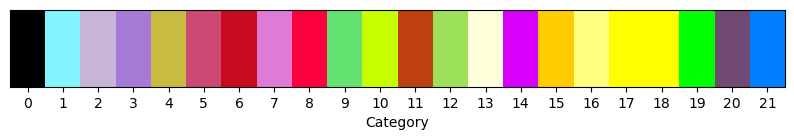

In [77]:
import matplotlib.colors as mcolors

NUM_CATEGORIES = 22


# R,G,B (0 to 255)
color_list = np.array([
    [0,0,0],       # 0
    [129,244,255], # 1
    [199,180,215], # 2 
    [166,121,215], # 3
    [200,187,66],  # 4
    [203,73,114],  # 5
    [200,10,30],   # 6
    [222,123,214], # 7
    [255, 0, 63],  # 8
    [100,226,113], # 9
    [200,255,0],  # 10
    [188, 65, 14],   # 11
    [157,225,90],  # 12
    [255,255,217],   # 13
    [217,0,255],   # 14
    [255,204,0],   # 15
    [255,255,127], # 16
    [255,255,0],   # 17
    [255,255,0], # 18 # TODO: will be merging with the above, remove then.
    [0,255,0],  # 19
    [114,73,114],  # 20
    [0, 127, 255], # 21
])

colormap = mcolors.ListedColormap(color_list / 255.0)

cat_ramp = range(NUM_CATEGORIES)
plt.figure(figsize=(10,1))
xarray.DataArray(np.vstack([cat_ramp] * 5), dims=["", "Category"], coords={"Category": cat_ramp}).plot(cmap=colormap, add_colorbar=False)
plt.xticks(cat_ramp)
plt.yticks([])
plt.show()

### Create a QGIS Color Map

In [13]:
lines = []

for i, c in enumerate(color_list):
    label = i
    a = 255
    r, g, b = c
    lines.append(f"{i} {r} {g} {b} {a} {label}\n")

f = open("dpolcat-qgis-cmap-wip.clr", "w")
f.writelines(lines)
f.close()
    

### Test decision tree logic

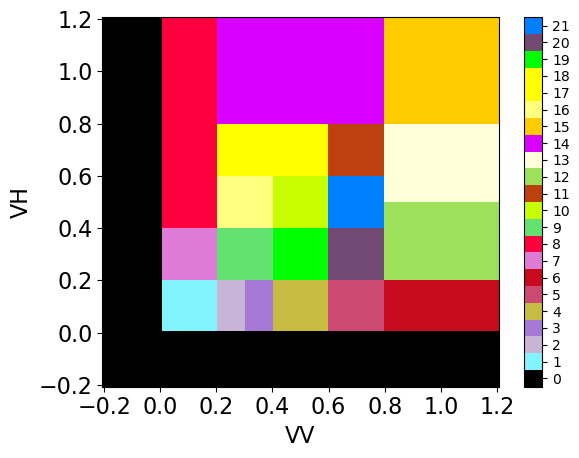

In [85]:
size = 100

steps = np.linspace(-0.2, 1.2, size)

vv_ramp = np.vstack([steps] * size)
vh_ramp = vv_ramp.transpose()
test1 = xarray.DataArray(vpolar_classify(vv_ramp, vh_ramp), coords=[steps, steps], dims=["VH", "VV"])
im = test1.plot(cmap=colormap, vmin=-0.5, vmax=NUM_CATEGORIES - 0.5, add_colorbar=False)
cbar = plt.colorbar(im)
cbar.set_ticks(range(NUM_CATEGORIES))
ax = plt.gca()
for el in [ax.xaxis.label, ax.yaxis.label,*ax.get_xticklabels(), *ax.get_yticklabels()]:
    el.set_fontsize(16)
plt.show()

In [15]:
def polcat_table(polcat_result):
    table = rich.table.Table("Category", "Count")
    for i in range(0, NUM_CATEGORIES):
        c = int((polcat_result == i).sum())
        table.add_row(f"{i}", f"{c}")
    return table

In [16]:
polcat_table(test1)

┏━━━━━━━━━━┳━━━━━━━┓
┃ Category ┃ Count ┃
┡━━━━━━━━━━╇━━━━━━━┩
│ 0        │ 2775  │
│ 1        │ 196   │
│ 2        │ 98    │
│ 3        │ 98    │
│ 4        │ 196   │
│ 5        │ 196   │
│ 6        │ 406   │
│ 7        │ 196   │
│ 8        │ 798   │
│ 9        │ 196   │
│ 10       │ 196   │
│ 11       │ 196   │
│ 12       │ 609   │
│ 13       │ 609   │
│ 14       │ 1218  │
│ 15       │ 841   │
│ 16       │ 196   │
│ 17       │ 196   │
│ 18       │ 196   │
│ 19       │ 196   │
│ 20       │ 196   │
│ 21       │ 196   │
└──────────┴───────┘

### Show results

In [17]:
result = xpolar_classify(vv2, vh2)

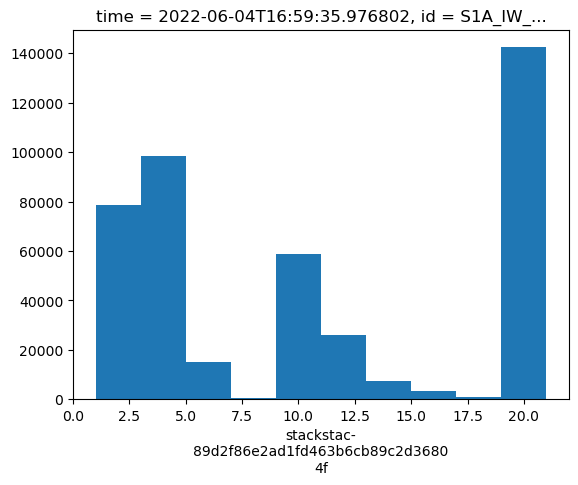

In [18]:
result.plot.hist()
plt.show()

In [19]:
polcat_table(result)

┏━━━━━━━━━━┳━━━━━━━┓
┃ Category ┃ Count ┃
┡━━━━━━━━━━╇━━━━━━━┩
│ 0        │ 0     │
│ 1        │ 16191 │
│ 2        │ 62386 │
│ 3        │ 54277 │
│ 4        │ 43984 │
│ 5        │ 9069  │
│ 6        │ 6174  │
│ 7        │ 438   │
│ 8        │ 0     │
│ 9        │ 51885 │
│ 10       │ 7006  │
│ 11       │ 1650  │
│ 12       │ 24506 │
│ 13       │ 6699  │
│ 14       │ 700   │
│ 15       │ 2684  │
│ 16       │ 846   │
│ 17       │ 64    │
│ 18       │ 710   │
│ 19       │ 99384 │
│ 20       │ 34377 │
│ 21       │ 8610  │
└──────────┴───────┘

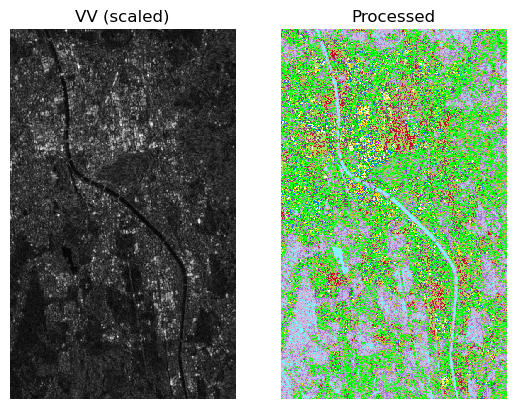

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2)

img1 = vv2.plot.imshow(cmap="gray", add_colorbar=False, ax=ax1)
img1.axes.set_axis_off();

img2 = result.plot.imshow(cmap=colormap, add_colorbar=False, ax=ax2, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)

ax1.set_title("VV (scaled)")
ax2.set_title("Processed")
img2.axes.set_axis_off();

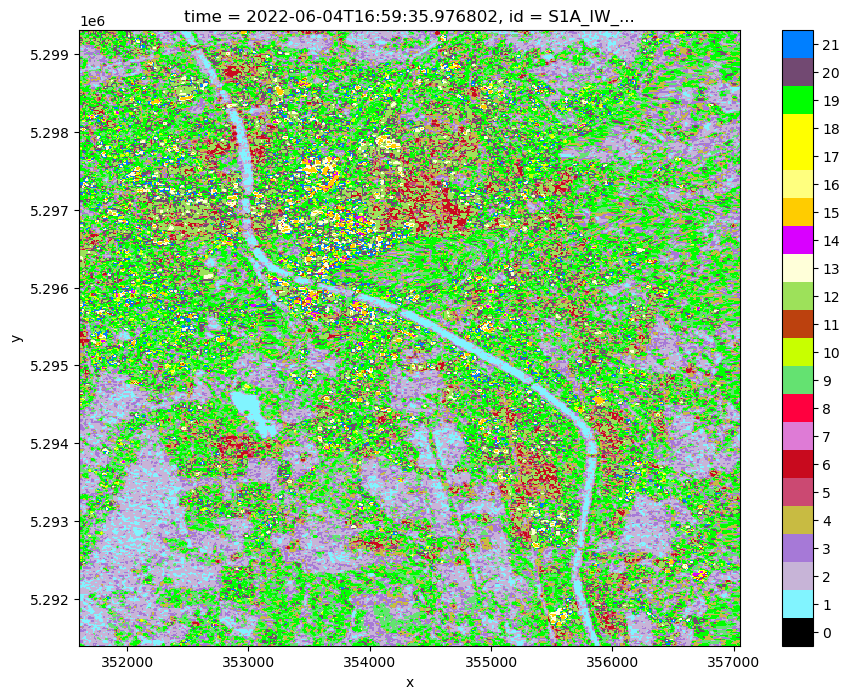

In [21]:
im = result.plot(cmap=colormap, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5, add_colorbar=False)
cbar = plt.colorbar(im)
cbar.set_ticks(range(NUM_CATEGORIES))
plt.show()

In [22]:
result.rio.write_crs(epsg_num, inplace=True)
result.rio.to_raster("result.tif")

## Experiment 1 - Flood Mapping (Salzburg)

Let's try and map some of the July 2021 floods near Zell am See.

Pre-event: 2021-07-13

Mid-event: 2021-07-19

Post-event: 2021-07-21

In [23]:
bbox = [12.40, 47.22, 12.74, 47.37]

search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime="2021-07-13/2021-07-21"
)
items = search.item_collection()
print(f"Found {len(items)} items")

Found 8 items


In [24]:
item = items[7]

table = rich.table.Table("key", "value")
table.add_row("item_id", item.id)
for k, v in sorted(item.properties.items()):
    table.add_row(k, str(v))

table

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ key                                   ┃ value                                                              ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ item_id                               │ S1B_IW_GRDH_1SDV_20210713T051805_20210713T051830_027771_03506A_rtc │
│ constellation                         │ Sentinel-1                                                         │
│ datetime                              │ 2021-07-13T05:18:18.069221Z                                        │
│ end_datetime                          │ 2021-07-13 05:18:30.568630+00:00                                   │
│ platform                              │ SENTINEL-1B                                                        │
│ proj:bbox                             │ [185220.0, 5117510.0, 480050.0, 5336100.0]                         │
│ proj:epsg                             │ 32633                                                              │
│ proj:shape                            │ [21859, 29483]                                                     │
│ proj:transform                        │ [10.0, 0.0, 185220.0, 0.0, -10.0, 5336100.0, 0.0, 0.0, 1.0]        │
│ s1:datatake_id                        │ 217194                                                             │
│ s1:instrument_configuration_ID        │ 2                                                                  │
│ s1:orbit_source                       │ DOWNLINK                                                           │
│ s1:processing_level                   │ 1                                                                  │
│ s1:product_timeliness                 │ NRT-3h                                                             │
│ s1:resolution                         │ high                                                               │
│ s1:shape                              │ [29483, 21859]                                                     │
│ s1:slice_number                       │ 17                                                                 │
│ s1:total_slices                       │ 32                                                                 │
│ sar:center_frequency                  │ 5.405                                                              │
│ sar:frequency_band                    │ C                                                                  │
│ sar:instrument_mode                   │ IW                                                                 │
│ sar:looks_azimuth                     │ 1                                                                  │
│ sar:looks_equivalent_number           │ 4.4                                                                │
│ sar:looks_range                       │ 5                                                                  │
│ sar:observation_direction             │ right                                                              │
│ sar:pixel_spacing_azimuth             │ 10                                                                 │
│ sar:pixel_spacing_range               │ 10                                                                 │
│ sar:polarizations                     │ ['VV', 'VH']                                                       │
│ sar:product_type                      │ GRD                                                                │
│ sar:resolution_azimuth                │ 22                                                                 │
│ sar:resolution_range                  │ 20                                                                 │
│ sat:absolute_orbit                    │ 27771                                                              │
│ sat:orbit_state                       │ descending                                                         │
│ sa

In [25]:
Image(url=item.assets["rendered_preview"].href)

In [26]:
# Images of interest, spanning the flood event
item_ids = [
    "S1B_IW_GRDH_1SDV_20210713T051805_20210713T051830_027771_03506A_rtc", # 13-Jul
    "S1B_IW_GRDH_1SDV_20210714T170642_20210714T170707_027793_03510C_rtc", # 14-Jul
    "S1A_IW_GRDH_1SDV_20210715T165919_20210715T165944_038791_0493BD_rtc", # 15-Jul
    "S1A_IW_GRDH_1SDV_20210719T051848_20210719T051913_038842_04955D_rtc", # 19-Jul
    "S1B_IW_GRDH_1SDV_20210721T165836_20210721T165901_027895_035419_rtc", # 21-Jul
]

selected_items = list(map(lambda item_id: get_item_by_id(items, item_id), item_ids))

###  Perform *dpolcat* on the before and after images

In [27]:
resolution = 10
epsg_num = 32633
pre = selected_items[0]
post = selected_items[3]

ds = stackstac.stack([pre, post], bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv").compute()
vh = ds.sel(band="vh").compute()

vv_scaled = scale_nice(vv)
vh_scaled = scale_nice(vh)

r_polcat = xpolar_classify(vv_scaled, vh_scaled)


/srv/conda/envs/notebook/lib/python3.10/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


#### Pre-flood, 13-July-2021

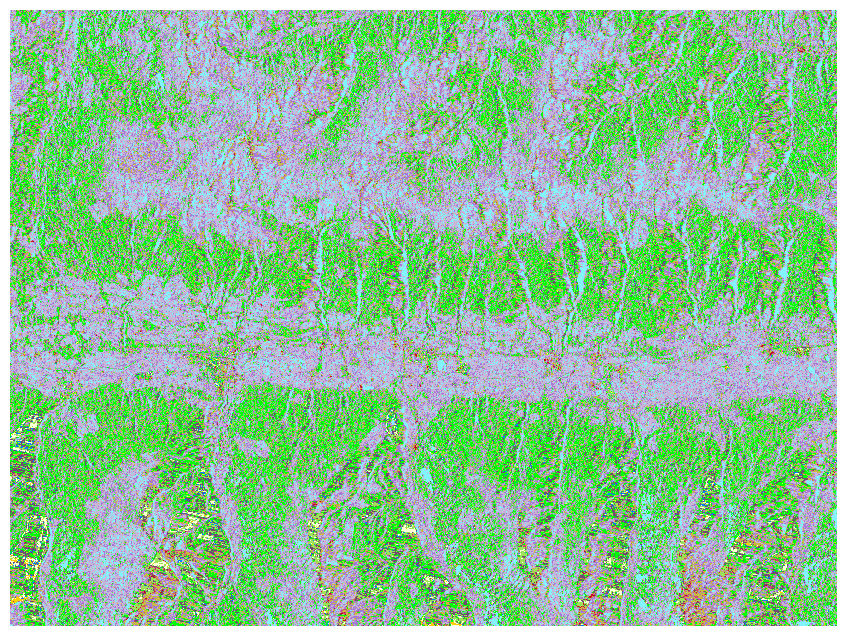

In [28]:
r_polcat[0].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

#### Mid-flood, 19-July-2021

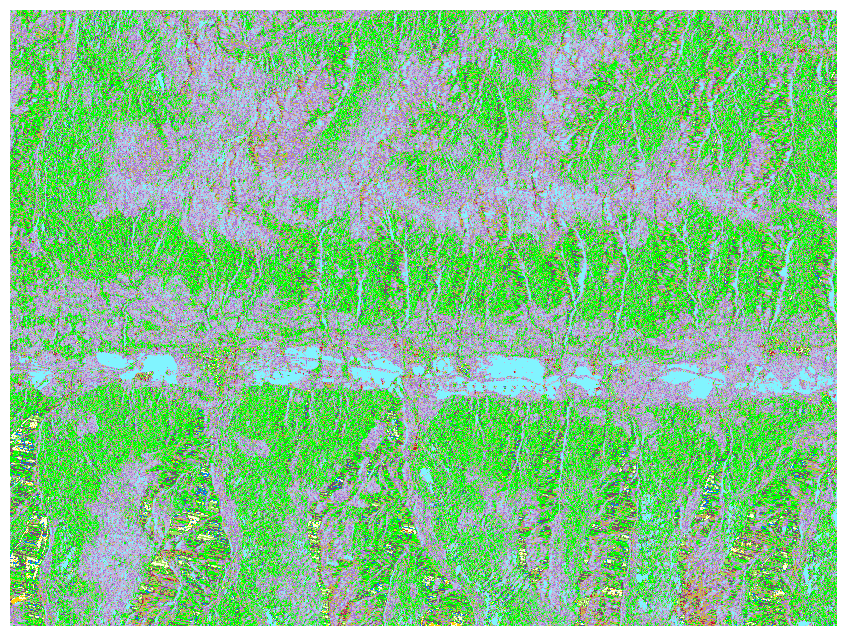

In [29]:
r_polcat[1].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

### Estimate flooded regions

Model the flooded cells as those changed to Category 1.

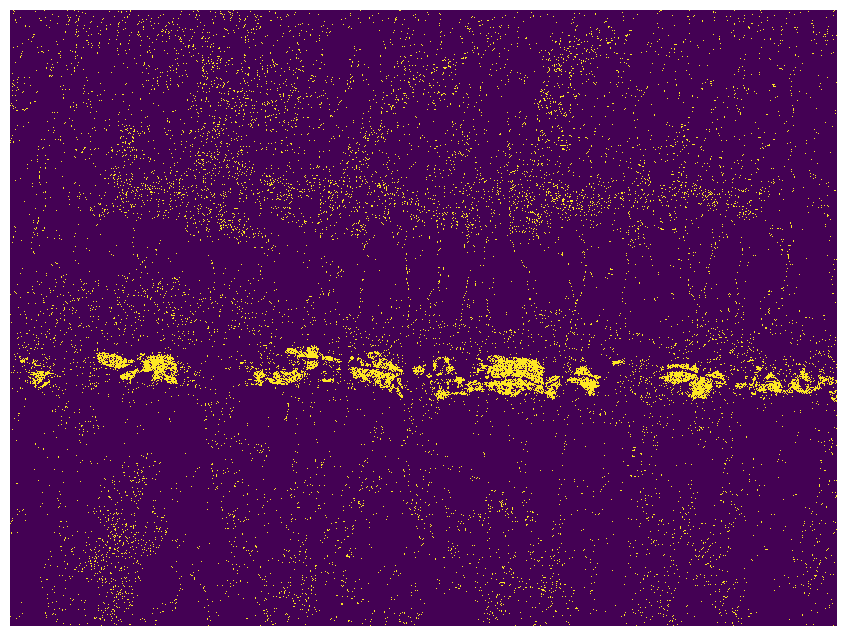

In [30]:
flooded = (r_polcat[1] == 1).astype(np.int8) - (r_polcat[0] == 1).astype(np.int8) == 1

flooded.plot.imshow(size=8, add_colorbar=False)
plt.axis("off")
plt.title("")
plt.show()

### Clean up the result

Apply a Gaussian filter, and threshold the result.

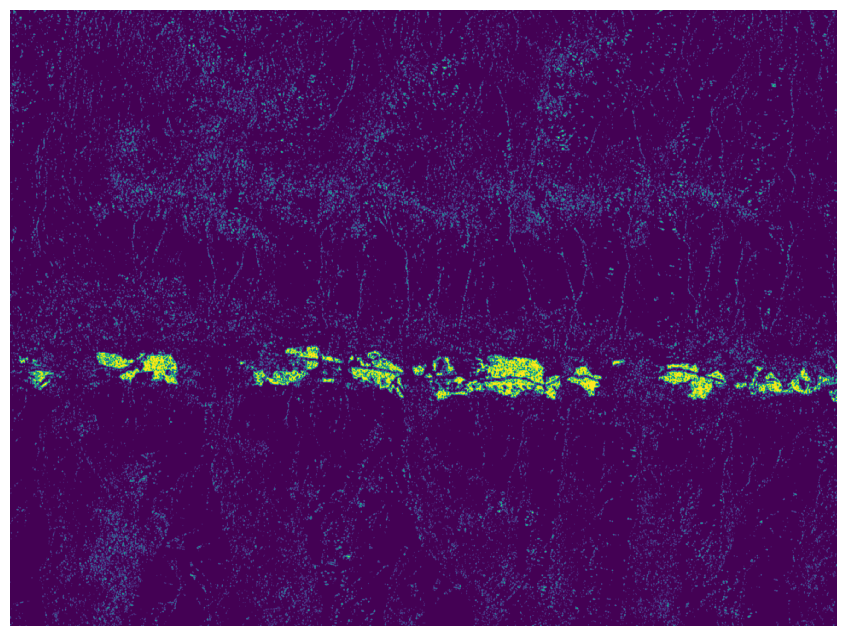

In [31]:
from scipy.ndimage import gaussian_filter

sigma = 1.5
flooded_gaussian = xarray.apply_ufunc(gaussian_filter, flooded.astype(np.float32), sigma)

flooded_gaussian.plot.imshow(size=8, add_colorbar=False)
plt.axis("off")
plt.title("")
plt.show()

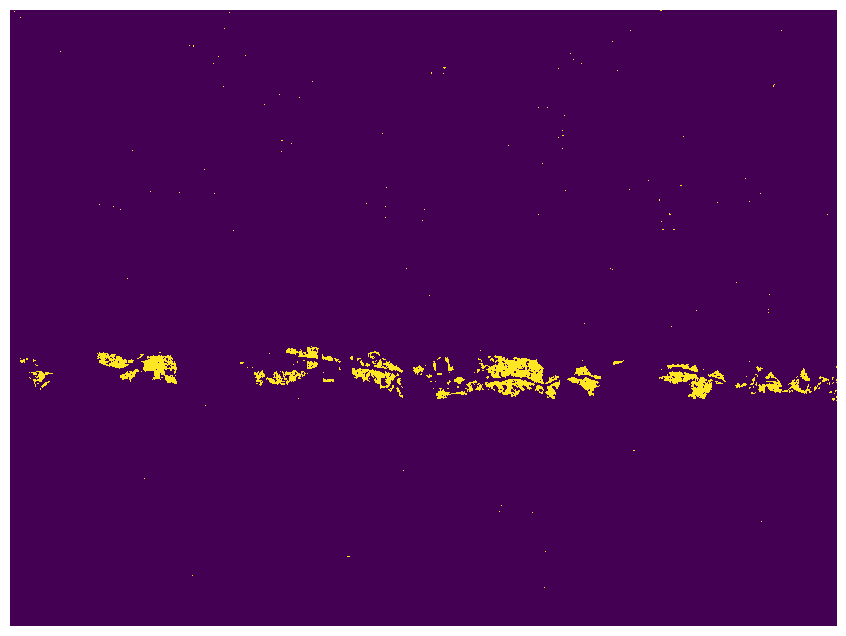

In [32]:
flooded_thres = flooded_gaussian > 0.6

flooded_thres.plot.imshow(size=8, add_colorbar=False)
plt.axis("off")
plt.title("")
plt.show()

## Experiment 2 - Flood Mapping Duisberg

Similar time to the Salzburg floods, but we have [reference maps available for this](https://emergency.copernicus.eu/mapping/ems-product-component/EMSR517_AOI06_DEL_MONIT01_r1_RTP03/1).

In [79]:
bbox = [6.638, 51.130, 7.731, 51.481]

search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime="2021-07-08/2021-07-21"
)
items = search.item_collection()
print(f"Found {len(items)} items")
summarize(items, bbox)

Found 14 items


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ id                                                                     ┃ date                               ┃ A/D         ┃ epsg   ┃ bbox_lonlat                                                                        ┃ bbox_enc ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ S1B_IW_GRDH_1SDV_20210721T055002_20210721T055027_027888_0353E2_rtc     │ 2021-07-21 05:50:02.309104+00:00   │ descending  │ 32631  │ [3.4730466081871034, 49.78892326408099, 7.648377215812892, 51.53491550150733]      │ True     │
│ S1B_IW_GRDH_1SDV_20210721T054937_20210721T055002_027888_0353E2_rtc     │ 2021-07-21 05:49:37.309039+00:00   │ descending  │ 32632  │ [3.8967066721240418, 51.10593016850672, 8.113359551531946, 53.212169773356706]     │ True     │
│ S1B_IW_GRDH_1SDV_20210719T171618_20210719T171643_027866_035336_rtc     │ 2021-07-19 17:16:18.305092+00:00   │ ascending   │ 32632  │ [5.71630009366021, 51.06649394758684, 9.887752538074754, 52.983106945868535]       │ True     │
│ S1B_IW_GRDH_1SDV_20210719T171553_20210719T171618_027866_035336_rtc     │ 2021-07-19 17:15:53.305158+00:00   │ ascending   │ 32632  │ [6.19433789999871, 49.57445281788958, 10.258793280330803, 51.48677801639151]       │ True     │
│ S1A_IW_GRDH_1SDV_20210718T172454_20210718T172519_038835_049522_rtc     │ 2021-07-18 17:24:54.267938+00:00   │ ascending   │ 32631  │ [3.9306861371844253, 49.912523924942775, 8.234329306366938, 51.78756010845123]     │ True     │
│ S1B_IW_GRDH_1SDV_20210716T054152_20210716T054217_027815_0351B0_rtc     │ 2021-07-16 05:41:52.085222+00:00   │ descending  │ 32632  │ [5.509598133773486, 49.439291526117415, 9.601999101259404, 51.441184369498124]     │ True     │
│ S1B_IW_GRDH_1SDV_20210716T054127_20210716T054152_027815_0351B0_rtc     │ 2021-07-16 05:41:27.084754+00:00   │ descending  │ 32632  │ [5.869658808207403, 50.945401330138054, 10.113799629343843, 52.92249959726789]     │ True     │
│ S1A_IW_GRDH_1SDV_20210715T055027_20210715T055052_038784_049389_rtc     │ 2021-07-15 05:50:27.398461+00:00   │ descending  │ 32632  │ [3.779901558467489, 50.6016906171258, 7.90494079781896, 52.71005673049012]         │ True     │
│ S1A_IW_GRDH_1SDV_20210713T171647_20210713T171712_038762_0492ED_rtc     │ 2021-07-13 17:16:47.632389+00:00   │ ascending   │ 32632  │ [5.978320169876422, 50.33900093363152, 10.064315685011316, 52.248218646876]        │ True     │
│ S1B_IW_GRDH_1SDV_20210712T172429_20210712T172454_027764_03503E_rtc     │ 2021-07-12 17:24:29.176755+00:00   │ ascending   │ 32631  │ [3.5838234828052693, 50.93923585971426, 8.000054157561458, 52.82179812550217]      │ True     │
│ S1B_IW_GRDH_1SDV_20210712T172404_20210712T172429_027764_03503E_rtc     │ 2021-07-12 17:24:04.175873+00:00   │ ascending   │ 32631  │ [4.066432743694067, 49.44731296921367, 8.359989746287617, 51.32564077663014]       │ True     │
│ S1A_IW_GRDH_1SDV_20210710T054217_20210710T054242_038711_04916F_rtc     │ 2021-07-10 05:42:17.036937+00:00   │ descending  │ 32632  │ [5.755213718912345, 50.44039761268625, 9.904079882381087, 52.42172696002313]       │ True     │
│ S1B_IW_GRDH_1SDV_20210709T055001_20210709T055026_027713_034EA7_rtc     │ 2021-07-09 05:50:01.473565+00:00   │ descending  │ 32631  │ [3.473047484118126, 49.78901320483857, 7.648520917054695, 51.53490979585055]       │ True     │
│ S1B_IW_GRDH_1SDV_20210709T054936_20210709T055001_027713_034EA7_rtc     │ 2021-07-09 05:49:36.473367+00:00   │ descending  │ 32632  │ [3.8965644016025087, 51.10592394284584, 8.113359551531946, 53.212169773356706]     │ True     │
└────────────────────────────────────────────────────────────────────────

In [80]:
# From inspection of the bounding boxes, these should be good pre and mid-event images
epsg_num=32632
resolution=10

# Baseline
# pre = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210710T054217_20210710T054242_038711_04916F_rtc")
# post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210713T171647_20210713T171712_038762_0492ED_rtc")

# Actual event
pre = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210713T171647_20210713T171712_038762_0492ED_rtc")
post = get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210716T054127_20210716T054152_027815_0351B0_rtc")

In [81]:
ds = stackstac.stack([pre, post], bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv").compute()
vh = ds.sel(band="vh").compute()

vv_scaled = scale_nice(vv)
vh_scaled = scale_nice(vh)

r_polcat = xpolar_classify(vv_scaled, vh_scaled)

/srv/conda/envs/notebook/lib/python3.10/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


In [82]:
r_polcat.rio.write_crs(epsg_num, inplace=True)
r_polcat.astype(np.uint8).rio.to_raster("duisburg_dpolcat.tif")

In [83]:
# vv_scaled.rio.write_crs(epsg_num, inplace=True)
# vv_scaled.rio.to_raster("duisburg_vv.tif")

In [87]:
polcat_table(r_polcat[0])

┏━━━━━━━━━━┳━━━━━━━━━┓
┃ Category ┃ Count   ┃
┡━━━━━━━━━━╇━━━━━━━━━┩
│ 0        │ 0       │
│ 1        │ 1225191 │
│ 2        │ 4480232 │
│ 3        │ 5055005 │
│ 4        │ 4009328 │
│ 5        │ 483901  │
│ 6        │ 224431  │
│ 7        │ 52317   │
│ 8        │ 38      │
│ 9        │ 5452056 │
│ 10       │ 202034  │
│ 11       │ 30580   │
│ 12       │ 755527  │
│ 13       │ 177148  │
│ 14       │ 7861    │
│ 15       │ 62200   │
│ 16       │ 30151   │
│ 17       │ 1266    │
│ 18       │ 13244   │
│ 19       │ 7543744 │
│ 20       │ 1555784 │
│ 21       │ 219550  │
└──────────┴─────────┘

### Calculate flood map

Again, based on new cat-1 pixels

In [36]:
flooded = ((r_polcat[1] == 1).astype(np.int8) - (r_polcat[0] == 1).astype(np.int8)) == 1

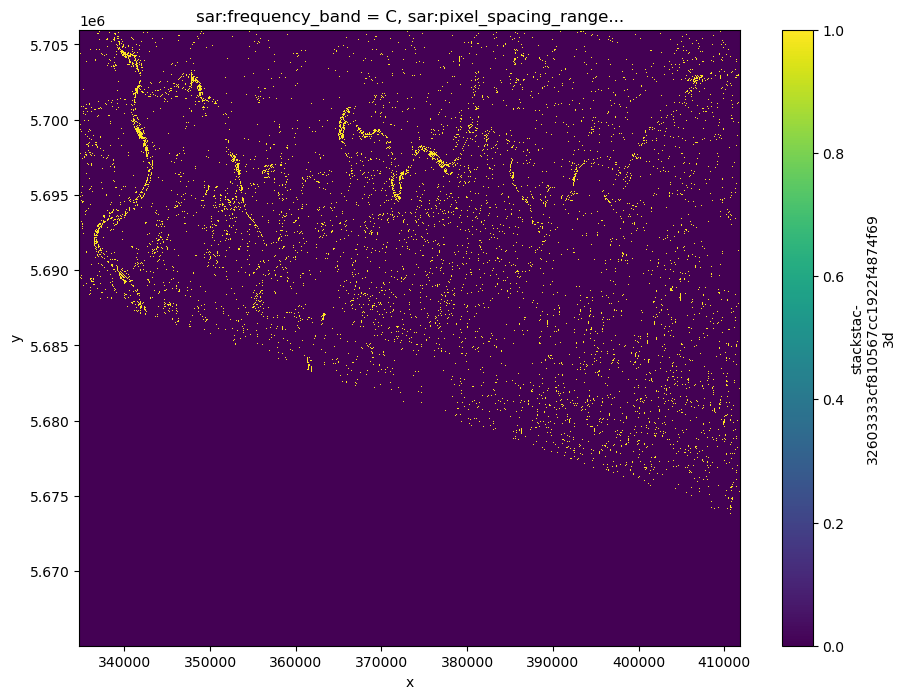

In [37]:
flooded.plot.imshow(size=8)
plt.show()

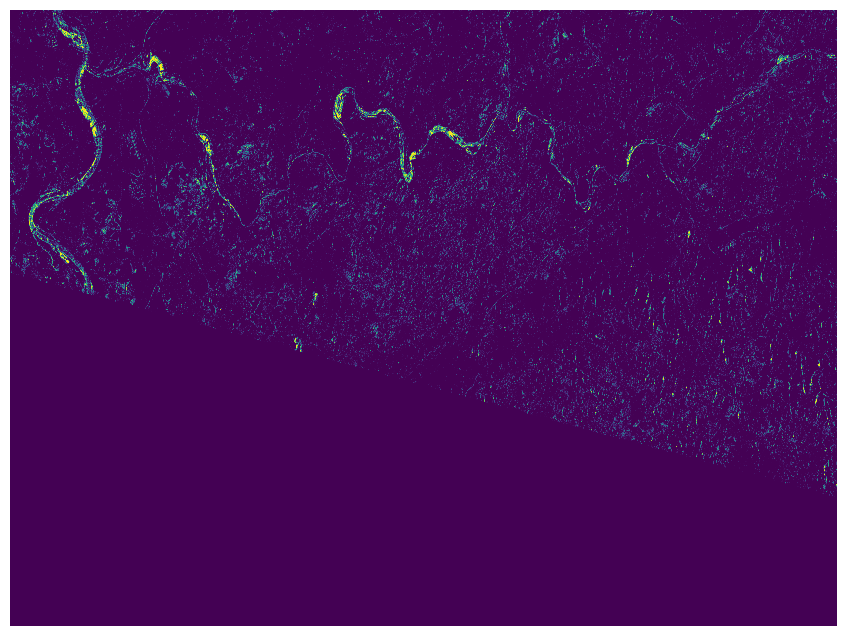

In [38]:
from scipy.ndimage import gaussian_filter

sigma = 1.5
flooded_gaussian = xarray.apply_ufunc(gaussian_filter, flooded.astype(np.float32), sigma)

flooded_gaussian.plot.imshow(size=8, add_colorbar=False)
plt.axis("off")
plt.title("")
plt.show()

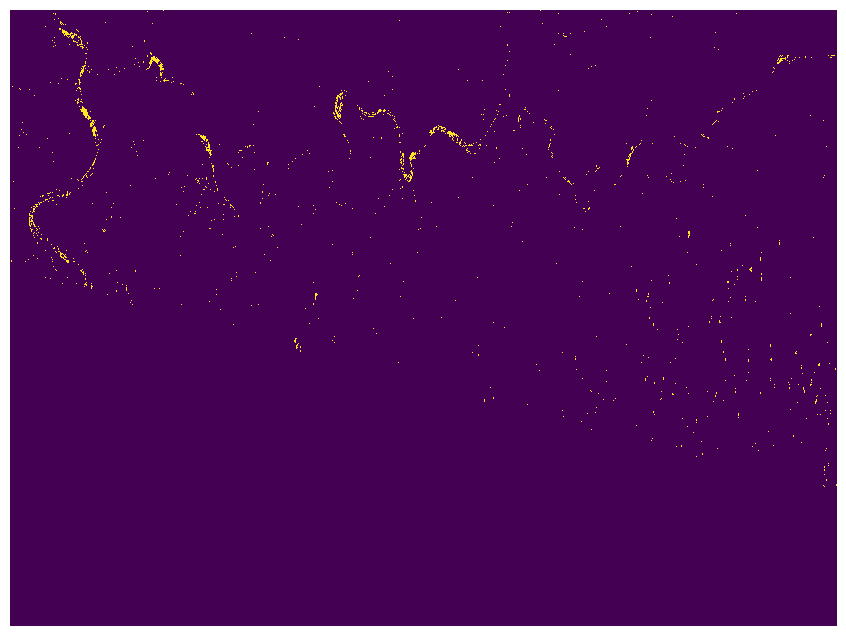

In [39]:
flooded_thres = flooded_gaussian > 0.6

flooded_thres.plot.imshow(size=8, add_colorbar=False)
plt.axis("off")
plt.title("")
plt.show()

In [40]:
flooded_thres.rio.write_crs(epsg_num, inplace=True)
flooded_thres.astype(np.uint8).rio.to_raster("flood_result.tif")

## Experiment 3 - Burned Area Delination, Xichang

Experiment based on [2] - Xichang forest fire, 30 March 2020.

Study area extent (lonmin, latmin, lonmax, latmax): (102.16,27.76,102.30,27.90)

In [41]:
bbox = [102.16,27.76,102.30,27.90]
search_start = "2020-03-11"
search_end = "2020-04-28"

search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime=f"{search_start}/{search_end}"
)
items = search.item_collection()
print(f"Found {len(items)} items")

summarize(items, bbox)

Found 16 items


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ id                                                                     ┃ date                               ┃ A/D         ┃ epsg   ┃ bbox_lonlat                                                                        ┃ bbox_enc ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ S1A_IW_GRDH_1SDV_20200428T230526_20200428T230551_032334_03BDFF_rtc     │ 2020-04-28 23:05:26.832412+00:00   │ descending  │ 32648  │ [101.65587651809541, 26.90443094026565, 104.55116224234843, 28.897658757544402]    │ True     │
│ S1A_IW_GRDH_1SDV_20200426T111629_20200426T111654_032298_03BCB9_rtc     │ 2020-04-26 11:16:29.015622+00:00   │ ascending   │ 32647  │ [100.344173379717, 27.62848177368945, 103.2838962842029, 29.53127242637651]        │ True     │
│ S1A_IW_GRDH_1SDV_20200426T111604_20200426T111629_032298_03BCB9_rtc     │ 2020-04-26 11:16:04.014362+00:00   │ ascending   │ 32647  │ [100.64874804844249, 26.119209242246363, 103.56471045903754, 28.026742908076045]   │ True     │
│ S1A_IW_GRDH_1SDV_20200416T230526_20200416T230551_032159_03B7DC_rtc     │ 2020-04-16 23:05:26.298362+00:00   │ descending  │ 32648  │ [101.6554743829454, 26.904421406808005, 104.55003402253945, 28.897654994236472]    │ True     │
│ S1A_IW_GRDH_1SDV_20200414T111628_20200414T111653_032123_03B699_rtc     │ 2020-04-14 11:16:28.502908+00:00   │ ascending   │ 32647  │ [100.34396961206919, 27.62839348479941, 103.28389248441476, 29.531182426990565]    │ True     │
│ S1A_IW_GRDH_1SDV_20200414T111603_20200414T111628_032123_03B699_rtc     │ 2020-04-14 11:16:03.503070+00:00   │ ascending   │ 32647  │ [100.64874804844249, 26.119209242246363, 103.56470665468854, 28.026652922959666]   │ True     │
│ S1A_IW_GRDH_1SDV_20200409T231334_20200409T231359_032057_03B456_rtc     │ 2020-04-09 23:13:34.819170+00:00   │ descending  │ 32647  │ [99.6283948780697, 27.265422106083772, 102.54813682726022, 29.109648697151318]     │ True     │
│ S1A_IW_GRDH_1SDV_20200404T230525_20200404T230550_031984_03B1B3_rtc     │ 2020-04-04 23:05:25.836994+00:00   │ descending  │ 32648  │ [101.65446904594289, 26.9043975681679, 104.54880401817819, 28.897470361527848]     │ True     │
│ S1A_IW_GRDH_1SDV_20200402T111628_20200402T111653_031948_03B06C_rtc     │ 2020-04-02 11:16:28.124647+00:00   │ ascending   │ 32647  │ [100.34356097560051, 27.628126653167207, 103.2836752614908, 29.530919074610104]    │ True     │
│ S1A_IW_GRDH_1SDV_20200402T111603_20200402T111628_031948_03B06C_rtc     │ 2020-04-02 11:16:03.124569+00:00   │ ascending   │ 32647  │ [100.64864299896652, 26.11884934766391, 103.56438721698859, 28.026303109502102]    │ True     │
│ S1A_IW_GRDH_1SDV_20200328T231334_20200328T231359_031882_03AE22_rtc     │ 2020-03-28 23:13:34.600098+00:00   │ descending  │ 32647  │ [99.62809180846664, 27.26542346657112, 102.54762392534386, 29.109662283292593]     │ True     │
│ S1A_IW_GRDH_1SDV_20200323T230525_20200323T230550_031809_03AB8F_rtc     │ 2020-03-23 23:05:25.574113+00:00   │ descending  │ 32648  │ [101.65396637790914, 26.90438564617143, 104.54859888772478, 28.89746967440635]     │ True     │
│ S1A_IW_GRDH_1SDV_20200321T111627_20200321T111652_031773_03AA42_rtc     │ 2020-03-21 11:16:27.913043+00:00   │ ascending   │ 32647  │ [100.34345964331631, 27.628127634748747, 103.2836752614908, 29.530919074610104]    │ True     │
│ S1A_IW_GRDH_1SDV_20200321T111602_20200321T111627_031773_03AA42_rtc     │ 2020-03-21 11:16:02.912949+00:00   │ ascending   │ 32647  │ [100.64854428408579, 26.118940750889106, 103.56418820710772, 28.026399845666035]   │ True     │
│ S1A_IW_GRDH_1SDV_20200316T231334_20200316T231359_031707_03A7FC_rtc     

In [42]:
# epsg_num=32647
epsg_num=32648

resolution=10

# Baseline
# pre = get_item_by_id(items, "...")
# post = get_item_by_id(items, "...")

# Actual event
pre = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200311T230525_20200311T230550_031634_03A563_rtc") # 11 March 2020
post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200428T230526_20200428T230551_032334_03BDFF_rtc") # 28 April 2020

# pre = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200328T231334_20200328T231359_031882_03AE22_rtc") # 28 March 2020
# post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200402T111628_20200402T111653_031948_03B06C_rtc") # 2 April 2020
# post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200402T111603_20200402T111628_031948_03B06C_rtc") # 2 April 2020

In [43]:
ds = stackstac.stack([pre, post], bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv").compute()
vh = ds.sel(band="vh").compute()

vv_scaled = scale_nice(vv)
vh_scaled = scale_nice(vh)

/srv/conda/envs/notebook/lib/python3.10/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


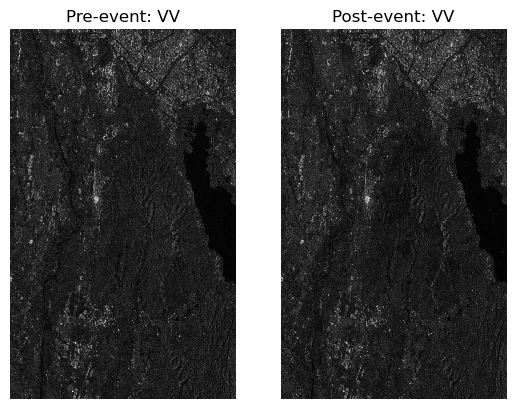

In [44]:
fig, (ax1, ax2) = plt.subplots(1, 2)

img1 = vv_scaled[0].plot.imshow(cmap="gray", add_colorbar=False, ax=ax1)
img1.axes.set_axis_off();
ax1.set_title("Pre-event: VV")

img2 = vv_scaled[1].plot.imshow(cmap="gray", add_colorbar=False, ax=ax2)
img2.axes.set_axis_off();
ax2.set_title("Post-event: VV")

plt.show()

In [45]:
r_polcat = xpolar_classify(vv_scaled, vh_scaled)

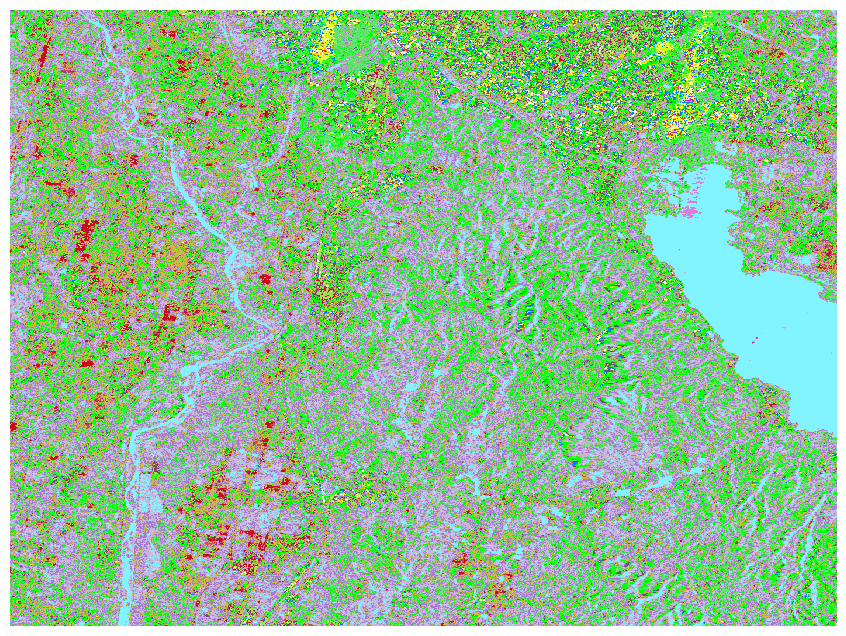

In [46]:
# Pre-event
r_polcat[0].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

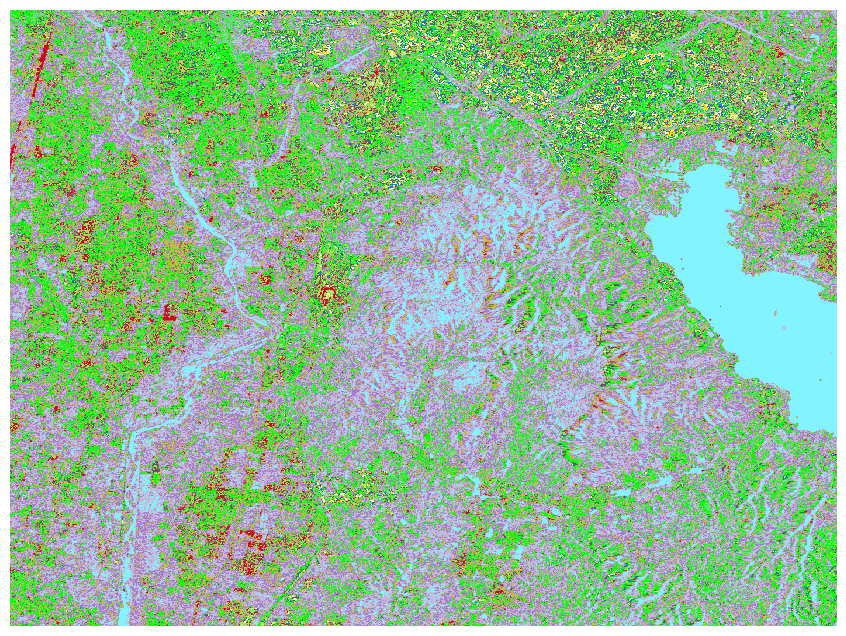

In [47]:
# Post-event
r_polcat[1].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

In [48]:
r_diff = r_polcat[1].astype(np.int16) - r_polcat[0]

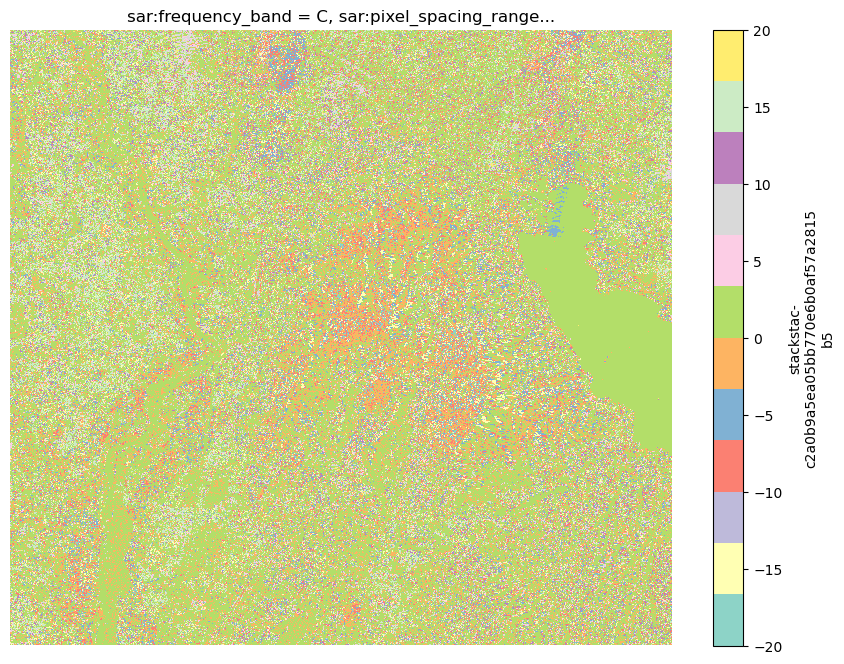

In [49]:
r_diff.plot.imshow(size=8, cmap="Set3")
# r_diff.plot.imshow(size=8)
plt.axis("off")
plt.show()

In [50]:
new_cat_1 = ((r_polcat[1] == 1).astype(np.int8) - (r_polcat[0] == 1).astype(np.int8)) == 1

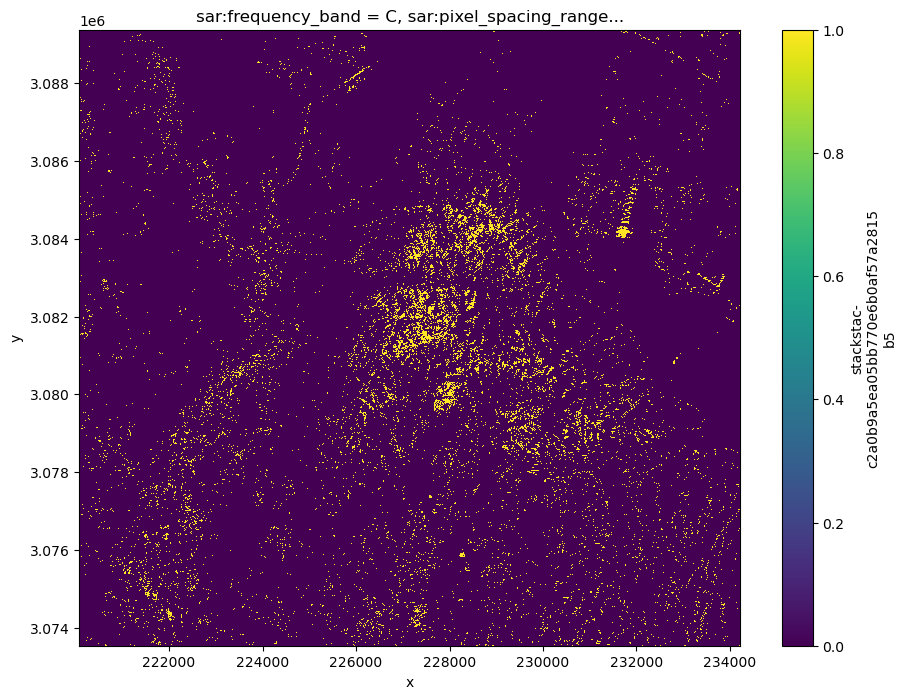

In [51]:
new_cat_1.plot.imshow(size=8)
plt.show()

In [52]:
new_cat_2 = ((r_polcat[1] == 2).astype(np.int8) - (r_polcat[0] == 2).astype(np.int8)) == 1

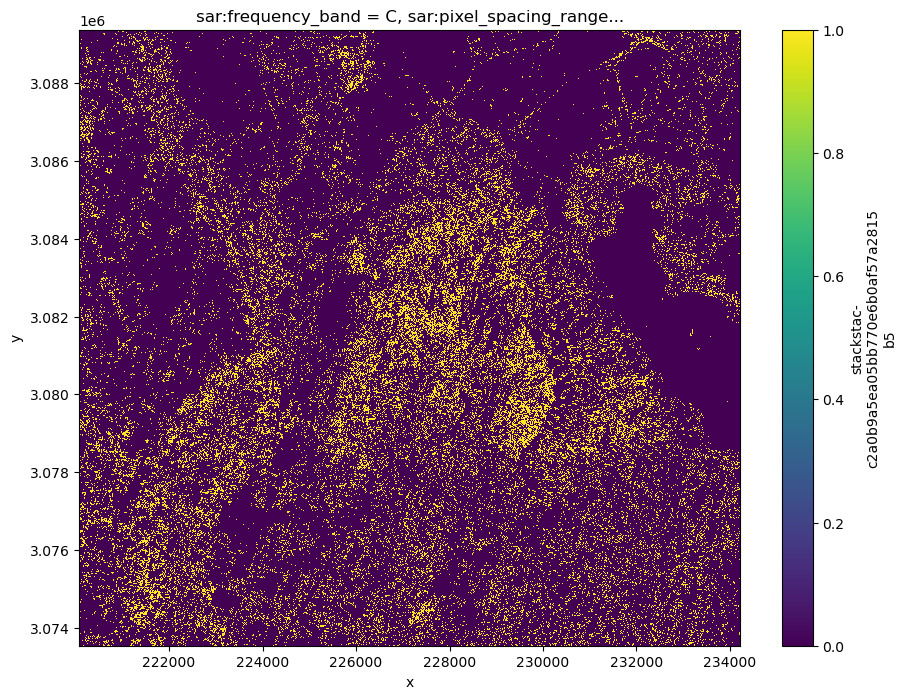

In [53]:
new_cat_2.plot.imshow(size=8)
plt.show()

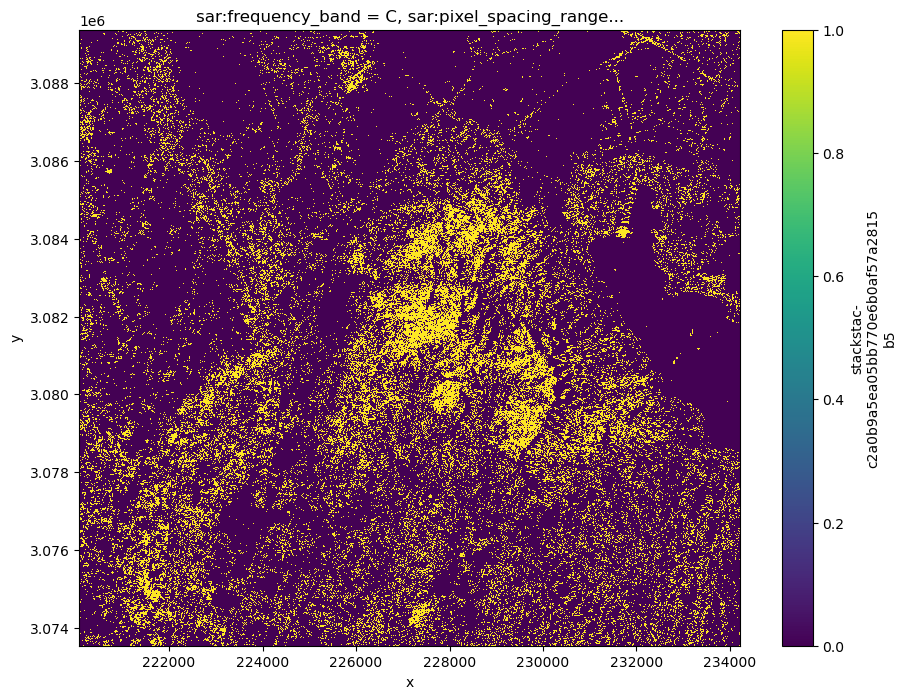

In [54]:
r_nc12 = new_cat_1 + new_cat_2

r_nc12.plot.imshow(size=8)
plt.show()

In [55]:
from scipy.ndimage import gaussian_filter

sigma = 1.0
r_gb = xarray.apply_ufunc(gaussian_filter, r_nc12.astype(np.float32), sigma)

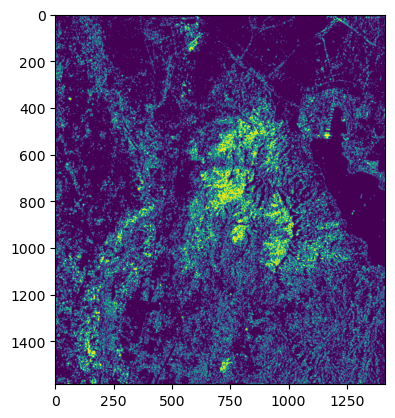

In [56]:
plt.imshow(r_gb)
plt.show()

In [57]:
r_gbt = r_gb >= 0.6

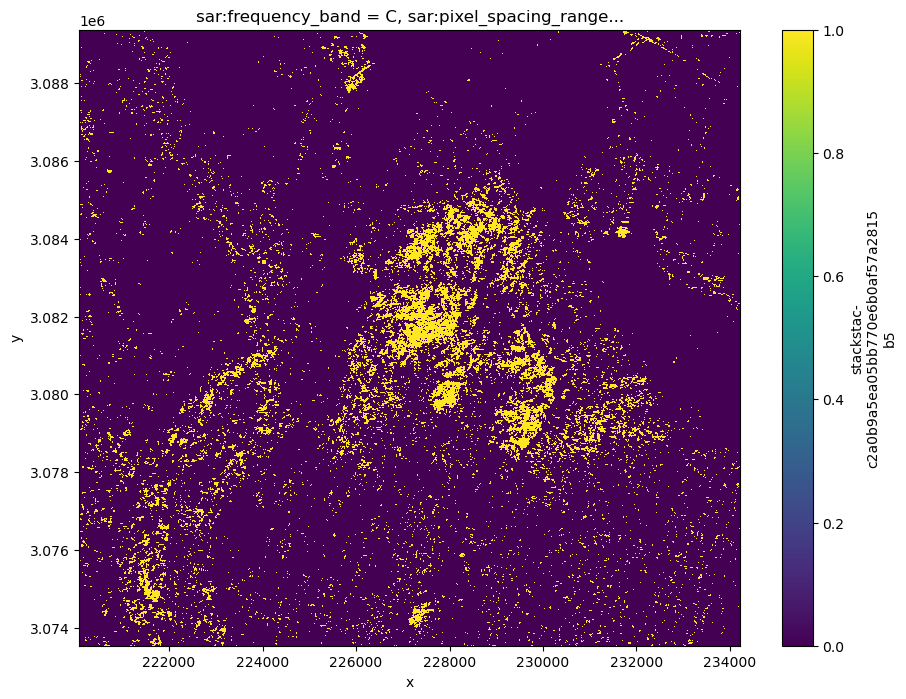

In [58]:
r_gbt.plot.imshow(size=8)

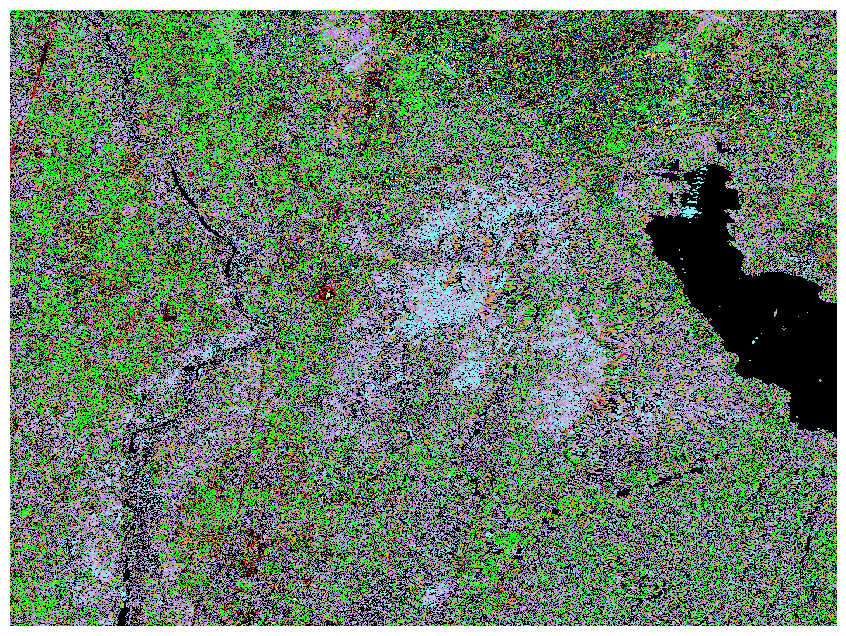

In [59]:
# Highlight changes
r_hdiff = (r_polcat[0] != r_polcat[1]) * r_polcat[1]

r_hdiff.plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

## Experiment 4 - Lava Mapping, La Palma

Revisiting the La Palma eruption, which ran from 19th September to 13th December 2021.

In [60]:
bbox = [-17.94,28.55,-17.77,28.66]

search_start = "2021-09-10"
search_end = "2021-12-27"

search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime=f"{search_start}/{search_end}"
)
items = search.item_collection()
print(f"Found {len(items)} items")

summarize(items, bbox)

Found 35 items


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ id                                                                    ┃ date                               ┃ A/D         ┃ epsg   ┃ bbox_lonlat                                                                         ┃ bbox_enc ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ S1A_IW_GRDH_1SDV_20211227T071102_20211227T071127_041191_04E50D_rtc    │ 2021-12-27 07:11:02.019939+00:00   │ descending  │ 32627  │ [-19.634013184131785, 27.34339276449585, -16.718616537530018, 29.1594145113461]     │ True     │
│ S1B_IW_GRDH_1SDV_20211221T071020_20211221T071045_030120_0398B7_rtc    │ 2021-12-21 07:10:20.404040+00:00   │ descending  │ 32627  │ [-19.634921717709545, 27.343491914312676, -16.719539394399636, 29.159444056452113]  │ True     │
│ S1A_IW_GRDH_1SDV_20211219T191349_20211219T191419_041082_04E179_rtc    │ 2021-12-19 19:13:49.251084+00:00   │ ascending   │ 32628  │ [-18.909696474218123, 27.139005916542914, -16.09509916813984, 29.354497810925437]   │ True     │
│ S1A_IW_GRDH_1SDV_20211215T071102_20211215T071127_041016_04DF4E_rtc    │ 2021-12-15 07:11:02.744800+00:00   │ descending  │ 32627  │ [-19.634821752870383, 27.343400670578223, -16.719440594341382, 29.15935076919093]   │ True     │
│ S1B_IW_GRDH_1SDV_20211213T191307_20211213T191337_030011_039546_rtc    │ 2021-12-13 19:13:07.766648+00:00   │ ascending   │ 32628  │ [-18.910501910170424, 27.13898344969161, -16.09571622672099, 29.354402497621788]    │ True     │
│ S1B_IW_GRDH_1SDV_20211209T071021_20211209T071046_029945_03932E_rtc    │ 2021-12-09 07:10:21.071452+00:00   │ descending  │ 32627  │ [-19.635023895106674, 27.34340264636784, -16.719641934137073, 29.159447338850914]   │ True     │
│ S1A_IW_GRDH_1SDV_20211207T191349_20211207T191419_040907_04DB90_rtc    │ 2021-12-07 19:13:49.713911+00:00   │ ascending   │ 32628  │ [-18.910646543336394, 27.140241663850343, -16.095935758107178, 29.355664141898448]  │ True     │
│ S1A_IW_GRDH_1SDV_20211203T071103_20211203T071128_040841_04D94F_rtc    │ 2021-12-03 07:11:03.150110+00:00   │ descending  │ 32627  │ [-19.63492282398595, 27.343401658509574, -16.719543133972852, 29.15935405165582]    │ True     │
│ S1B_IW_GRDH_1SDV_20211201T191308_20211201T191337_029836_038FCC_rtc    │ 2021-12-01 19:13:08.121320+00:00   │ ascending   │ 32628  │ [-18.90918993795332, 27.138929882764455, -16.09448017898198, 29.3544126446495]      │ True     │
│ S1B_IW_GRDH_1SDV_20211127T071021_20211127T071046_029770_038DA5_rtc    │ 2021-11-27 07:10:21.606265+00:00   │ descending  │ 32627  │ [-19.63522714338931, 27.34331436604936, -16.719850752969567, 29.15936389858158]     │ True     │
│ S1A_IW_GRDH_1SDV_20211125T191350_20211125T191420_040732_04D575_rtc    │ 2021-11-25 19:13:50.297469+00:00   │ ascending   │ 32628  │ [-18.91083848501566, 27.139965826880935, -16.096238009968317, 29.355029934560626]   │ True     │
│ S1A_IW_GRDH_1SDV_20211121T071103_20211121T071128_040666_04D335_rtc    │ 2021-11-21 07:11:03.731144+00:00   │ descending  │ 32627  │ [-19.63573249871275, 27.343319303494226, -16.720469730179243, 29.159293585416542]   │ True     │
│ S1B_IW_GRDH_1SDV_20211119T191308_20211119T191338_029661_038A42_rtc    │ 2021-11-19 19:13:08.745584+00:00   │ ascending   │ 32628  │ [-18.909772043772623, 27.138282523134627, -16.095088551082185, 29.353505188910564]  │ True     │
│ S1B_IW_GRDH_1SDV_20211115T071022_20211115T071047_029595_03882D_rtc    │ 2021-11-15 07:10:22.070275+00:00   │ descending  │ 32627  │ [-19.634822859223473, 27.343310414777704, -16.719546873529023, 29.15926404685788]   │ True     │
│ S1A_IW_GRDH_1SDV_20211113T191350_20211113T191420_040557_04CF6C_rtc    │

In [61]:
epsg_num=32627

resolution=10

# Baseline
# pre = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210910T071103_20210910T071128_039616_04AEEC_rtc") # 10 Sep 2021
# post = get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210916T071021_20210916T071046_028720_036D6C_rtc") # 16 Sep 2021

# Actual event
# pre = get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210916T071021_20210916T071046_028720_036D6C_rtc") # 16 Sep 2021
# post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20211016T071104_20211016T071129_040141_04C0FA_rtc") # 16 Oct 2021

# Baseline after event
pre = get_item_by_id(items, "S1B_IW_GRDH_1SDV_20211221T071020_20211221T071045_030120_0398B7_rtc") # 21-Dec-2021
post = get_item_by_id(items, "S1A_IW_GRDH_1SDV_20211227T071102_20211227T071127_041191_04E50D_rtc") # 27-Dec-2021

In [62]:
ds = stackstac.stack([pre, post], bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv").compute()
vh = ds.sel(band="vh").compute()

vv_scaled = scale_nice(vv)
vh_scaled = scale_nice(vh)

/srv/conda/envs/notebook/lib/python3.10/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


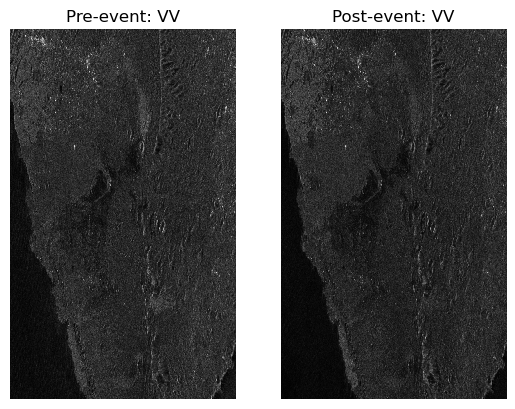

In [63]:
fig, (ax1, ax2) = plt.subplots(1, 2)

img1 = vv_scaled[0].plot.imshow(cmap="gray", add_colorbar=False, ax=ax1)
img1.axes.set_axis_off();
ax1.set_title("Pre-event: VV")

img2 = vv_scaled[1].plot.imshow(cmap="gray", add_colorbar=False, ax=ax2)
img2.axes.set_axis_off();
ax2.set_title("Post-event: VV")

plt.show()

In [64]:
r_polcat = xpolar_classify(vv_scaled, vh_scaled)

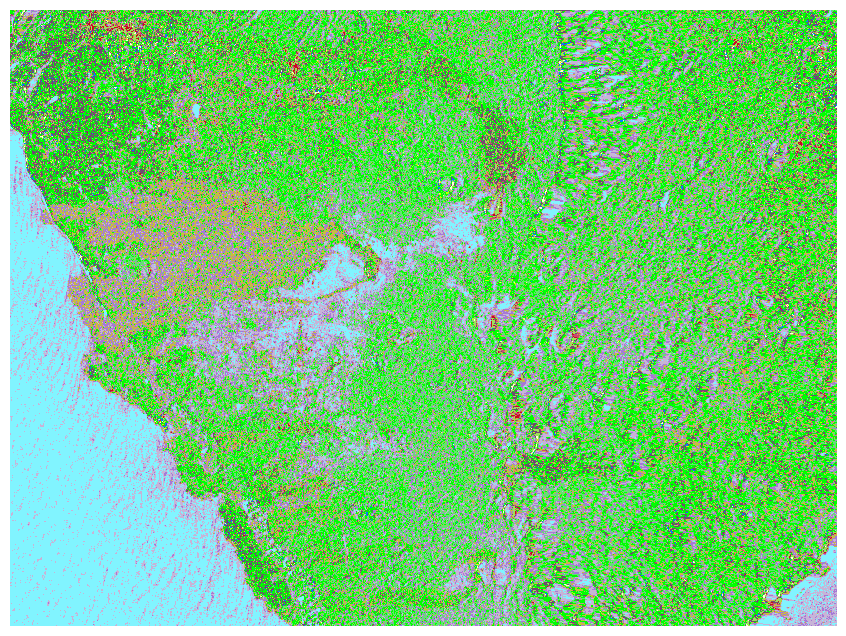

In [65]:
# Pre-event
r_polcat[0].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

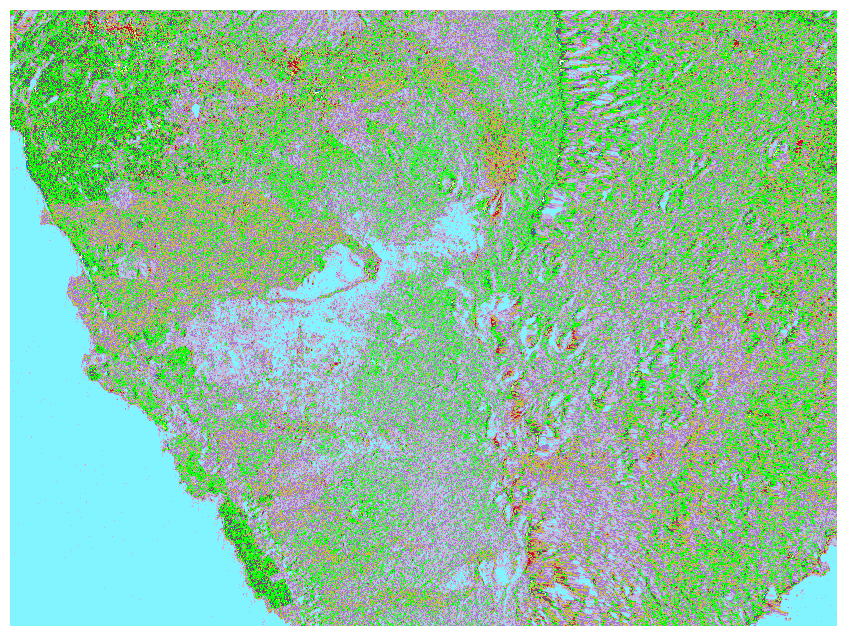

In [66]:
# Post-event
r_polcat[1].plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

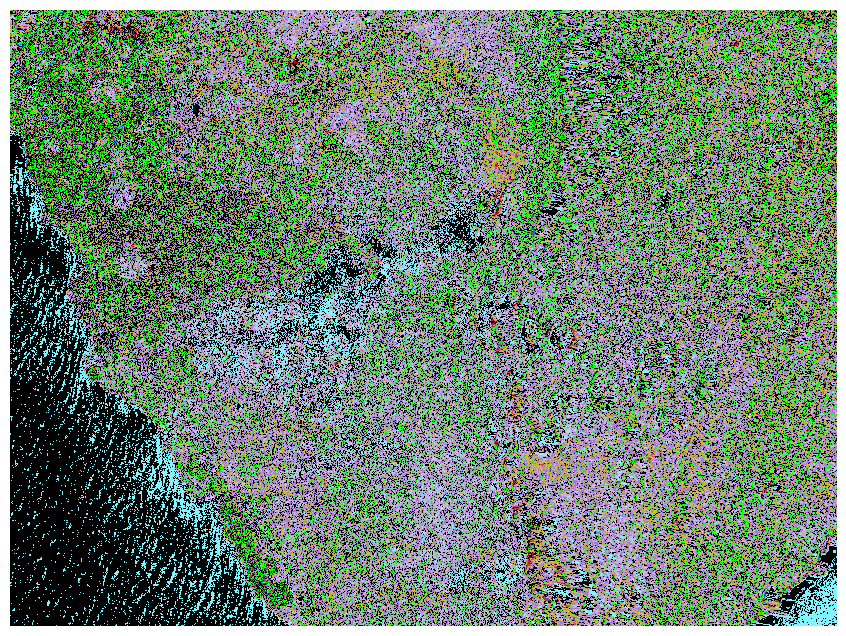

In [67]:
# Highlight changes
r_hdiff = (r_polcat[0] != r_polcat[1]) * r_polcat[1]

r_hdiff.plot.imshow(cmap=colormap, add_colorbar=False, size=8, vmin=-0.5, vmax=NUM_CATEGORIES-0.5)
plt.axis("off")
plt.title("")
plt.show()

In [68]:
# Summarize category changes
cats = np.array(range(NUM_CATEGORIES))
cat_diff_counts = np.zeros((NUM_CATEGORIES, NUM_CATEGORIES))
for c1 in cats:
    for c2 in cats:
        # Count how many times category c1 changes to c2
        cd = (r_polcat[1] == c1) & (r_polcat[0] == c2) & (c1 != c2)
        cat_diff_counts[c2, c1] = np.sum(cd)

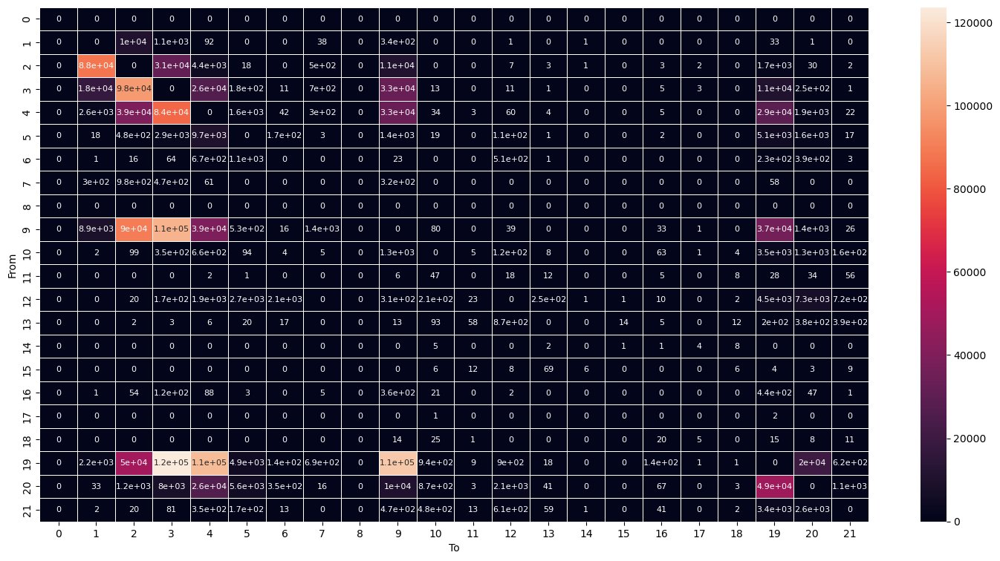

In [69]:
# Plot change matrix.
# Note: Where From and To are equal, 0 is used rather than the actual same-count, to avoid skewing the visual.
fig, ax = plt.subplots(figsize=(18, 9))
seaborn.heatmap(cat_diff_counts, linewidths=0.5, annot=True, ax=ax, annot_kws={"size": 8})
plt.ylabel("From")
plt.xlabel("To")
plt.show()

## Experiment 5 - Salzachauen Timeseries

Let's take a look at the annual changes to the [Salzachauen](https://www.salzachauen.at/).

In [70]:
bbox = [12.93,47.84,13.01,47.95]

search_start = "2015-01-01"
search_end = "2023-06-17"

search = catalog.search(
    collections=["sentinel-1-rtc"], bbox=bbox, datetime=f"{search_start}/{search_end}"
)
items = search.item_collection()
print(f"Found {len(items)} items")

# summarize(items, bbox)

Found 1080 items


In [71]:
epsg_num=32633

resolution=10

# all with ascending orbits.
selected_items = [
    # get_item_by_id(items, "S1A_IW_GRDH_1SDV_20160611T165852_20160611T165917_011666_011DB9_rtc"), # 11-Jun-2016
    # get_item_by_id(items, "S1B_IW_GRDH_1SDV_20170612T165809_20170612T165834_006020_00A90D_rtc"), # 12-Jun-2017
    # get_item_by_id(items, "S1B_IW_GRDH_1SDV_20180607T165815_20180607T165840_011270_014AF7_rtc"), # 07-Jun-2018
    
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20190109T165819_20190109T165844_014420_01AD7C_rtc"), # 09-Jan-2019
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20190115T165902_20190115T165927_025491_02D361_rtc"), # 15-Jan-2019
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20190121T165818_20190121T165843_014595_01B316_rtc"), # 21-Jan-2019
    
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20190608T165904_20190608T165929_027591_031D18_rtc"), # 08-Jun-2019
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20190614T165821_20190614T165846_016695_01F6B7_rtc"), # 14-Jun-2019
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20190620T165905_20190620T165930_027766_032252_rtc"), # 20-Jun-2019
    
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200110T165909_20200110T165934_030741_03864C_rtc"), # 10-Jan-2020
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20200116T165825_20200116T165850_019845_025868_rtc"), # 16-Jan-2020
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200122T165908_20200122T165933_030916_038C74_rtc"), # 22-Jan-2020
    
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20200608T165828_20200608T165853_021945_029A5B_rtc"), # 08-Jun-2020
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20200614T165912_20200614T165937_033016_03D2FD_rtc"), # 14-Jun-2020
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20200620T165828_20200620T165853_022120_029FAC_rtc"), # 20-Jun-2020
    
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210110T165831_20210110T165856_025095_02FCB9_rtc"), # 10-Jan-2021
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210116T165914_20210116T165939_036166_043D8C_rtc"), # 16-Jan-2021
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210122T165830_20210122T165855_025270_030252_rtc"), # 22-Jan-2021
    
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210603T165833_20210603T165858_027195_033F94_rtc"), # 03-Jun-2021
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20210609T165917_20210609T165942_038266_0483FE_rtc"), # 09-Jun-2021
    get_item_by_id(items, "S1B_IW_GRDH_1SDV_20210615T165834_20210615T165859_027370_0344D7_rtc"), # 15-Jun-2021
    
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20211230T165921_20211230T165946_041241_04E6B7_rtc"), # 30-Dec-2021
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20220111T165920_20220111T165945_041416_04ECAD_rtc"), # 11-Jan-2022
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20220123T165920_20220123T165945_041591_04F274_rtc"), # 23-Jan-2022
    
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20220604T165923_20220604T165948_043516_05321B_rtc"), # 04-Jun-2022
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20220616T165923_20220616T165948_043691_053750_rtc"), # 16-Jun-2022
    get_item_by_id(items, "S1A_IW_GRDH_1SDV_20220628T165924_20220628T165949_043866_053C94_rtc"), # 28-Jun-2022
    
    # get_item_by_id(items, "S1A_IW_GRDH_1SDV_20230611T165928_20230611T165953_048941_05E29E_rtc"), # 11-Jun-2023
    # June 2015 only has descending.
]

In [72]:
ds = stackstac.stack(selected_items, bounds_latlon=bbox, epsg=epsg_num, resolution=resolution)

vv = ds.sel(band="vv").compute()
vh = ds.sel(band="vh").compute()

vv_scaled = scale_nice(vv)
vh_scaled = scale_nice(vh)

/srv/conda/envs/notebook/lib/python3.10/site-packages/stackstac/prepare.py:363: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


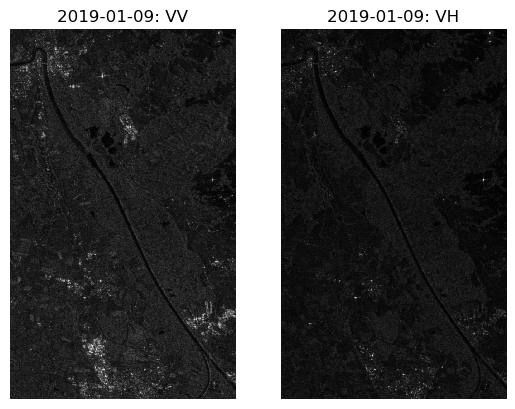

In [73]:
# Preview item
fig, (ax1, ax2) = plt.subplots(1, 2)

preview_item_i = 0

dtstr = str(selected_items[preview_item_i].datetime)[:10]

img1 = vv_scaled[0].plot.imshow(cmap="gray", add_colorbar=False, ax=ax1)
img1.axes.set_axis_off();
ax1.set_title(f"{dtstr}: VV")

img2 = vh_scaled[0].plot.imshow(cmap="gray", add_colorbar=False, ax=ax2)
img2.axes.set_axis_off();
ax2.set_title(f"{dtstr}: VH")

plt.show()

In [74]:
r_polcat = xpolar_classify(vv_scaled, vh_scaled)

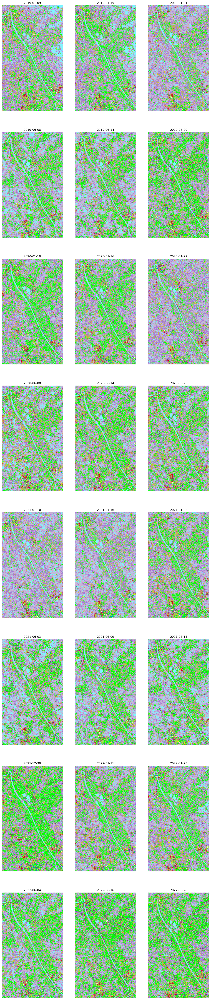

In [75]:
n = len(selected_items)
fig, axs = plt.subplots(n//3,3, figsize=(15,n*3))
axs = axs.flatten()

for i in range(n):
    img = r_polcat[i].plot.imshow(cmap=colormap, add_colorbar=False, vmin=-0.5, vmax=NUM_CATEGORIES-0.5, ax=axs[i])
    img.axes.set_axis_off();
    dtstr = str(selected_items[i].datetime)[:10]
    axs[i].set_title(f"{dtstr}")

plt.show()

In [76]:
r_polcat.rio.write_crs(epsg_num, inplace=True)
r_polcat.rio.to_raster("result.tif")

## References

[1]: *Accessing Sentinel-1 RTC data with the Planetary Computer STAC API* (Jupyter Notebook, Microsoft Planetary Computer, accessed June 2023)

[2]: *A Burned Area Extracting Method Using Polarization and Texture Feature of Sentinel-1A Images* (Shama et al, IEEE Geoscience and Remote Sensing Letters (Volume 20), Feb 2023, https://doi.org/10.1109/LGRS.2023.3246117)